<h2><center>California K-12 Public Schools</center></h2>
<h1><center>Meeting the Standards Projection</center></h1>


   <img src='images/istock_kids_stem_0.jpeg' width="900">
   
   **Credit:**  [natural start](https://naturalstart.org/feature-stories/engaging-children-stem-education-early)

In [1]:
# Load relevant packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as sm
import warnings

import folium  #needed for interactive map
from folium.plugins import HeatMap

sns.set(style='ticks')

warnings.filterwarnings("ignore")  # Suppress all warnings

# EXPLORATORY DATA ANALYSIS
## Model development dataset is ready for exploration

### Summary statistics
- Check individual variable distribution
    - Verify the spread of the data
    - May be able to infer the mean from distribution plots
    
### Review for outliers and anomalies
- Boxplots
    - Quick way to identify outliers or anomalous observations
    - Important to consider these in the context of the problem

In [2]:
# load datafiles

# dfs with number of students as values
df_language = pd.read_csv('data/df_language_clean')
df_math = pd.read_csv('data/df_math_clean')

# dfs with percentage of students as values
language = pd.read_csv('data/language_with_percentage_values')
math = pd.read_csv('data/math_with_percentage_values')

In [3]:
language.head()

,School Name,School Code,Zip Code,County Name,County Code,Latitude,Longitude,Median Household Income,CAASPP Reported Enrollment,Enrollment K-12,...,Hispanic,Pacific Islander,White,Two/More Races,< High School,High School Grad,Some College,College Grad,Graduate School,Percentage Standard Met and Above
0,21st Century Learning Institute,129882,92223,Riverside,33.0,33.962281,-116.984589,64738.0,58.0,88.0,...,56.90,0.00,31.03,0.00,10.34,22.41,37.93,15.52,6.90,44.64
1,A. E. Arnold Elementary,6027767,90630,Orange,30.0,33.824900,-118.045700,84051.0,447.0,739.0,...,29.31,-0.22,24.83,1.57,3.36,9.84,19.02,30.87,27.07,65.60
2,A. G. Cook Elementary,6028211,92844,Orange,30.0,33.777700,-117.953000,48345.0,192.0,366.0,...,22.40,0.00,5.21,3.12,-0.52,6.77,7.29,17.19,3.12,81.18
3,A. G. Currie Middle,6085377,92780,Orange,30.0,33.743100,-117.824900,64089.0,585.0,611.0,...,90.94,-0.17,2.56,-0.17,38.12,28.72,14.02,6.67,2.56,30.38
4,A. J. Dorsa Elementary,6046114,95122,Santa Clara,43.0,37.369388,-121.833560,57470.0,184.0,371.0,...,90.22,0.00,-0.54,-0.54,44.57,29.89,13.04,8.15,-0.54,29.83


In [4]:
# Summary statistics of columns of interest - table uses df_language which has the values as count not percentage
table = df_language[['Median Household Income', 'CAASPP Reported Enrollment',
       'Enrollment K-12', 'Total Revenue per Pupil',
       'Total Expenditures per Pupil', 'Free Meal Count K-12',
       'Current Expense Per ADA', 'Male', 'Female', 'Military', 'Non Military',
       'Homeless', 'Non Homeless', 'Disadvantaged', 'Not Disadvantaged',
       'Black', 'Native American', 'Asian', 'Hispanic', 'Pacific Islander',
       'White', 'Two/More Races', '< High School', 'High School Grad',
       'Some College', 'College Grad', 'Graduate School',
       'Percentage Standard Met and Above']]

table.describe().T.apply(lambda s: s.apply('{0:.2f}'.format)) #lambda function suppress scientific notation

,count,mean,std,min,25%,50%,75%,max
Median Household Income,9646.00,62594.36,25278.66,11922.00,43526.00,56671.00,77080.75,236912.00
CAASPP Reported Enrollment,9646.00,340.92,273.12,11.00,169.00,280.00,424.00,3665.00
Enrollment K-12,9646.00,641.40,533.32,0.00,351.00,530.00,750.00,6324.00
Total Revenue per Pupil,9646.00,14506.12,3195.08,632.00,13068.00,14107.00,15411.00,106533.00
Total Expenditures per Pupil,9646.00,14494.85,3352.22,490.00,12937.00,14225.00,15700.00,99133.00
Free Meal Count K-12,9646.00,336.84,311.58,0.00,120.00,266.00,453.00,3863.00
Current Expense Per ADA,9646.00,13592.73,4798.39,7970.70,11860.86,12983.99,14218.36,126344.42
Male,9646.00,174.28,138.89,-1.00,87.00,144.00,217.00,1818.00
Female,9646.00,166.58,135.48,-1.00,82.00,136.00,207.75,1847.00
Military,9646.00,3.25,16.36,-1.00,0.00,0.00,0.00,408.00


In [5]:
math.head()

,School Name,School Code,Zip Code,County Name,County Code,Latitude,Longitude,Median Household Income,CAASPP Reported Enrollment,Enrollment K-12,...,Hispanic,Pacific Islander,White,Two/More Races,< High School,High School Grad,Some College,College Grad,Graduate School,Percentage Standard Met and Above
0,21st Century Learning Institute,129882,92223,Riverside,33.0,33.962281,-116.984589,64738.0,58.0,88.0,...,56.90,0.00,31.03,0.00,10.34,22.41,37.93,15.52,6.90,10.71
1,A. E. Arnold Elementary,6027767,90630,Orange,30.0,33.824900,-118.045700,84051.0,447.0,739.0,...,29.31,-0.22,24.83,1.57,3.36,9.84,19.02,30.87,27.07,63.41
2,A. G. Cook Elementary,6028211,92844,Orange,30.0,33.777700,-117.953000,48345.0,192.0,366.0,...,22.40,0.00,5.21,3.12,-0.52,6.77,7.29,17.19,3.12,71.81
3,A. G. Currie Middle,6085377,92780,Orange,30.0,33.743100,-117.824900,64089.0,585.0,611.0,...,90.94,-0.17,2.56,-0.17,38.12,28.72,14.02,6.67,2.56,18.35
4,A. J. Dorsa Elementary,6046114,95122,Santa Clara,43.0,37.369388,-121.833560,57470.0,184.0,371.0,...,90.22,0.00,-0.54,-0.54,44.57,29.89,13.04,8.15,-0.54,25.41


In [6]:
# Summary statistics of columns of interest - table1 uses df_language which has the values as count not percentage
table1 = df_math[['Median Household Income', 'CAASPP Reported Enrollment',
       'Enrollment K-12', 'Total Revenue per Pupil',
       'Total Expenditures per Pupil', 'Free Meal Count K-12',
       'Current Expense Per ADA', 'Male', 'Female', 'Military', 'Non Military',
       'Homeless', 'Non Homeless', 'Disadvantaged', 'Not Disadvantaged',
       'Black', 'Native American', 'Asian', 'Hispanic', 'Pacific Islander',
       'White', 'Two/More Races', '< High School', 'High School Grad',
       'Some College', 'College Grad', 'Graduate School',
       'Percentage Standard Met and Above']]

table1.describe().T.apply(lambda s: s.apply('{0:.2f}'.format)) #lambda function suppress scientific notation

,count,mean,std,min,25%,50%,75%,max
Median Household Income,9637.00,62591.94,25273.60,11922.00,43526.00,56671.00,77047.00,236912.00
CAASPP Reported Enrollment,9637.00,341.21,273.04,11.00,169.00,280.00,424.00,3666.00
Enrollment K-12,9637.00,641.92,533.28,0.00,352.00,531.00,750.00,6324.00
Total Revenue per Pupil,9637.00,14504.58,3193.93,632.00,13068.00,14107.00,15411.00,106533.00
Total Expenditures per Pupil,9637.00,14493.53,3351.54,490.00,12937.00,14225.00,15700.00,99133.00
Free Meal Count K-12,9637.00,337.06,311.63,0.00,120.00,266.00,454.00,3863.00
Current Expense Per ADA,9637.00,13591.03,4799.42,7970.70,11860.86,12983.99,14218.36,126344.42
Male,9637.00,174.43,138.85,-1.00,87.00,144.00,217.00,1818.00
Female,9637.00,166.73,135.44,-1.00,82.00,136.00,208.00,1848.00
Military,9637.00,3.25,16.37,-1.00,0.00,0.00,0.00,408.00


## Variables Distribution

The distribution of a variable is a description of the relative numbers of times each possible outcome occurs.

### Language Art & Literature Dataset

In [10]:
def distribution_plot(df, var):
    # Distribution plot
    plt.figure(figsize=(7,5))
    sns.distplot(df[var])
    plt.title(var, fontsize = 16)

    # Adding labels
    _ = plt.xlabel('% Students', fontsize=16)
    _ = plt.ylabel('Density', fontsize=16)

    plt.show()

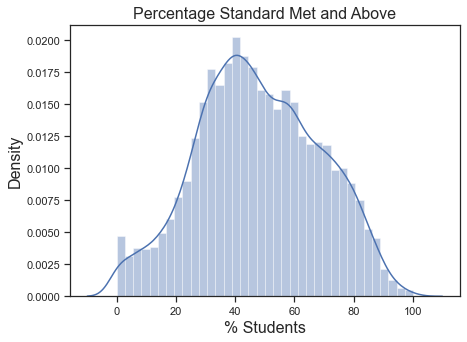

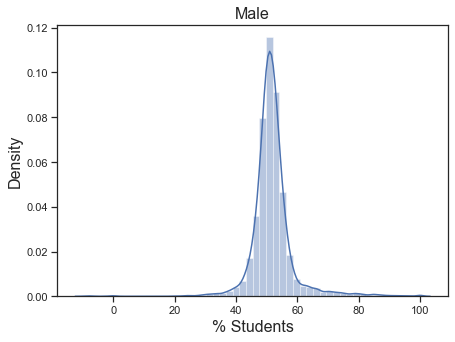

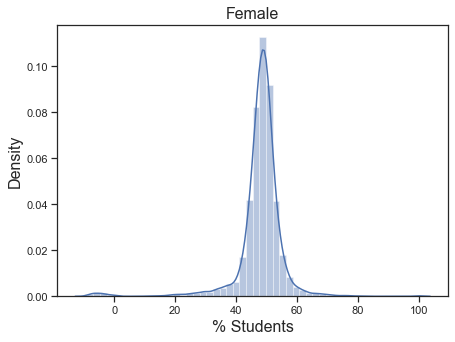

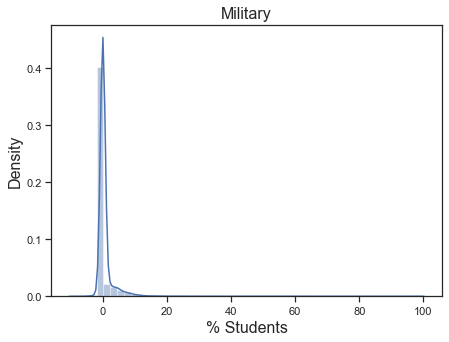

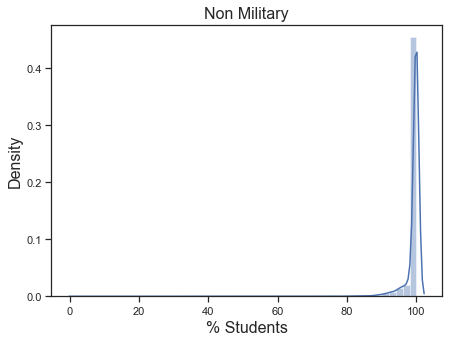

...

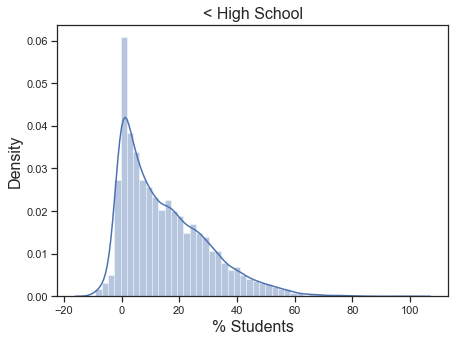

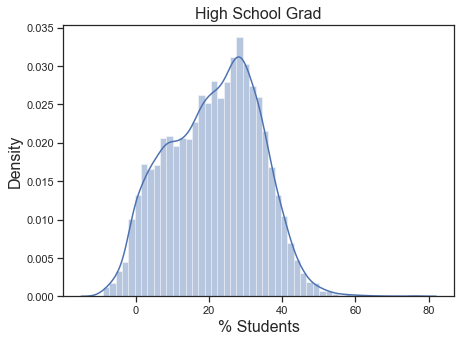

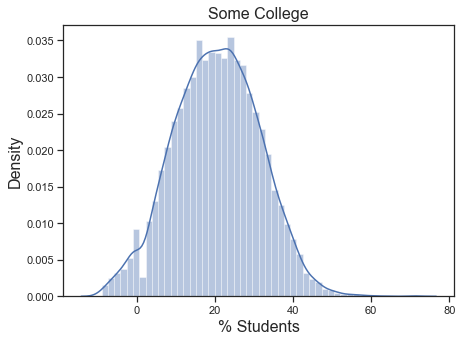

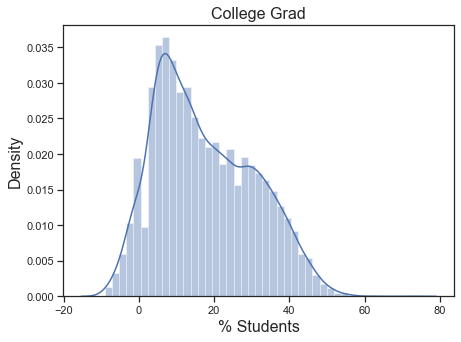

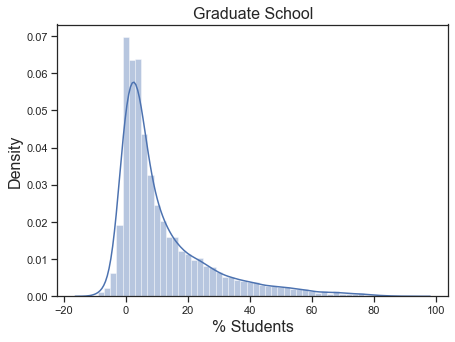

In [11]:
variables = ['Percentage Standard Met and Above', 'Male', 'Female', 'Military', 'Non Military', 'Homeless', 'Non Homeless',
       'Disadvantaged', 'Not Disadvantaged', 'Black', 'Native American', 'Asian', 'Hispanic',
       'Pacific Islander', 'White', 'Two/More Races', '< High School',
       'High School Grad', 'Some College', 'College Grad', 'Graduate School']

for var in variables:
    distribution_plot(language, var)

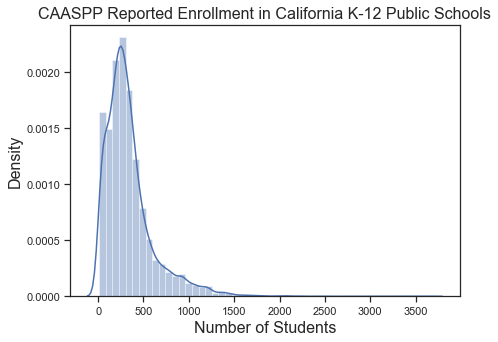

In [12]:
# Distribution plot
plt.figure(figsize=(7,5))
sns.distplot(language['CAASPP Reported Enrollment'])
plt.title('CAASPP Reported Enrollment in California K-12 Public Schools', fontsize = 16)

# Adding labels
_ = plt.xlabel('Number of Students', fontsize=16)
_ = plt.ylabel('Density', fontsize=16)

plt.show()

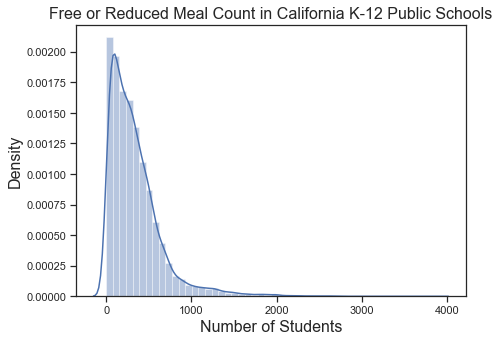

In [13]:
# Distribution plot
plt.figure(figsize=(7,5))
sns.distplot(language['Free Meal Count K-12'])
plt.title('Free or Reduced Meal Count in California K-12 Public Schools', fontsize = 16)

# Adding labels
_ = plt.xlabel('Number of Students', fontsize=16)
_ = plt.ylabel('Density', fontsize=16)

plt.show()

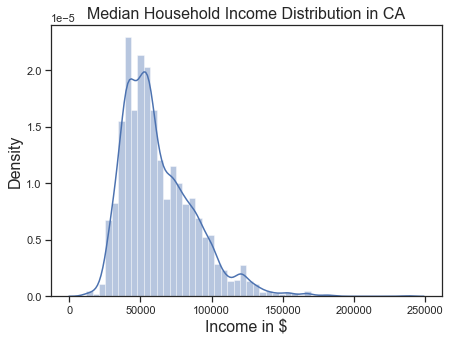

In [14]:
# Distribution plot
plt.figure(figsize=(7,5))
sns.distplot(language['Median Household Income'])
plt.title('Median Household Income Distribution in CA', fontsize = 16)

# Adding labels
_ = plt.xlabel('Income in $', fontsize=16)
_ = plt.ylabel('Density', fontsize=16)

plt.show()

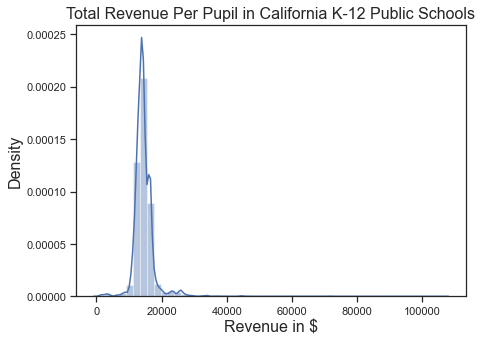

In [15]:
# Distribution plot
plt.figure(figsize=(7,5))
sns.distplot(language['Total Revenue per Pupil'])
plt.title('Total Revenue Per Pupil in California K-12 Public Schools', fontsize = 16)

# Adding labels
_ = plt.xlabel('Revenue in $', fontsize=16)
_ = plt.ylabel('Density', fontsize=16)

plt.show()

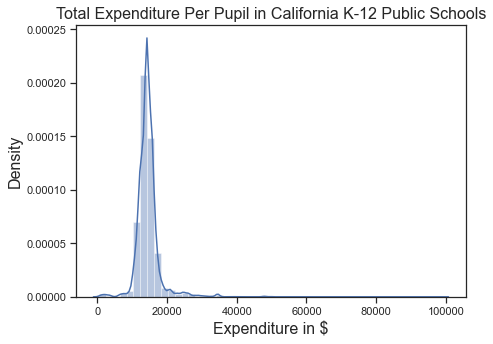

In [16]:
# Distribution plot
plt.figure(figsize=(7,5))
sns.distplot(language['Total Expenditures per Pupil'])
plt.title('Total Expenditure Per Pupil in California K-12 Public Schools', fontsize = 16)

# Adding labels
_ = plt.xlabel('Expenditure in $', fontsize=16)
_ = plt.ylabel('Density', fontsize=16)

plt.show()

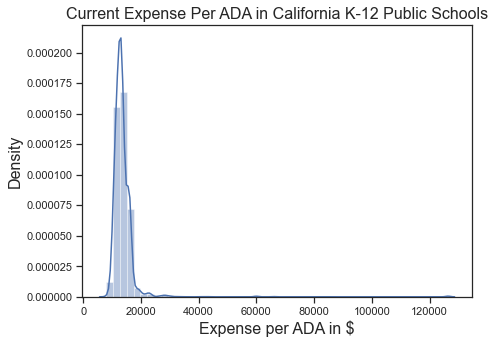

In [17]:
# Distribution plot
plt.figure(figsize=(7,5))
sns.distplot(language['Current Expense Per ADA'])
plt.title('Current Expense Per ADA in California K-12 Public Schools', fontsize = 16)

# Adding labels
_ = plt.xlabel('Expense per ADA in $', fontsize=16)
_ = plt.ylabel('Density', fontsize=16)

plt.show()  

Text(13.304100000000005, 0.5, 'Density')

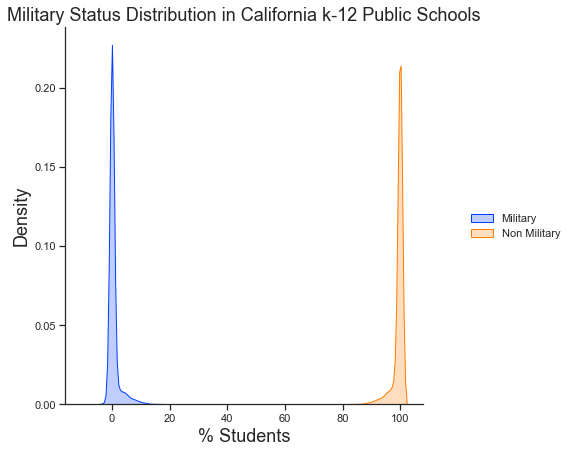

In [18]:
# subset features of interest
mil = language[['Military', 'Non Military']]

# plot
_ = sns.displot(mil, kind="kde", fill=True, palette="bright")
_.fig.set_size_inches(8,6)
plt.title("Military Status Distribution in California k-12 Public Schools", fontsize=18)
plt.xlabel('% Students', fontsize=18)
plt.ylabel('Density', fontsize=18)

Text(14.602600000000002, 0.5, 'Density')

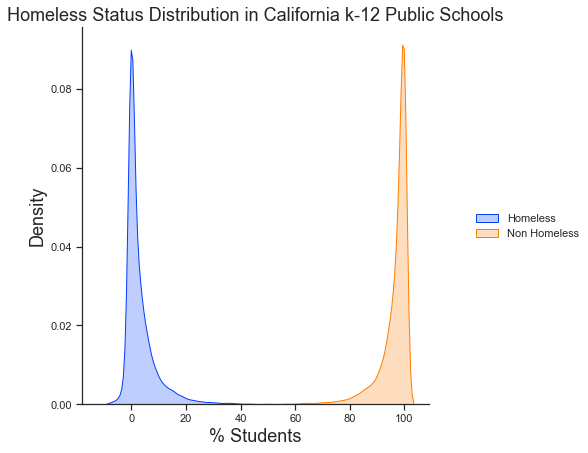

In [19]:
# subset features
hom = language[['Homeless', 'Non Homeless']]

# plot
_ = sns.displot(hom, kind="kde", fill=True, palette="bright")
_.fig.set_size_inches(8,6)
plt.title("Homeless Status Distribution in California k-12 Public Schools", fontsize=18)
plt.xlabel('% Students', fontsize=18)
plt.ylabel('Density', fontsize=18)

Text(10.771016666666675, 0.5, 'Density')

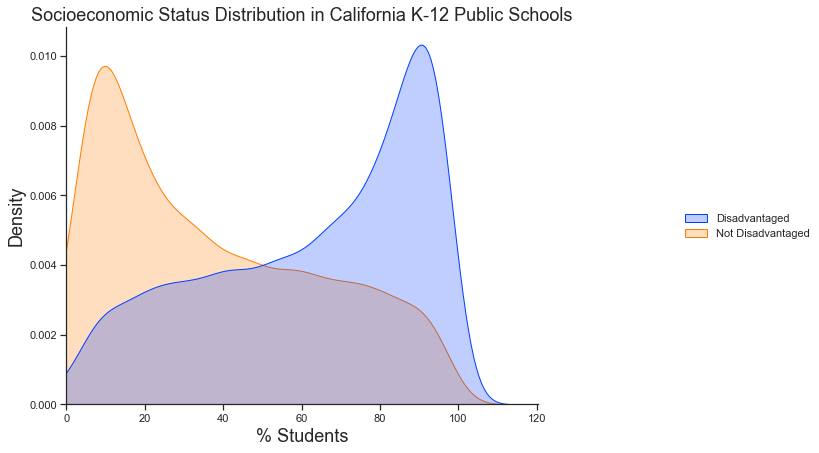

In [20]:
# subset feature of interest
econ = language[['Disadvantaged', 'Not Disadvantaged']]

# plot
_ = sns.displot(econ, kind="kde", fill=True, palette="bright")
_.fig.set_size_inches(12,6)
plt.title("Socioeconomic Status Distribution in California K-12 Public Schools", fontsize=18)
plt.xlabel('% Students', fontsize=18)
plt.xlim(xmin=0)
plt.ylabel('Density', fontsize=18)

<Figure size 864x576 with 0 Axes>

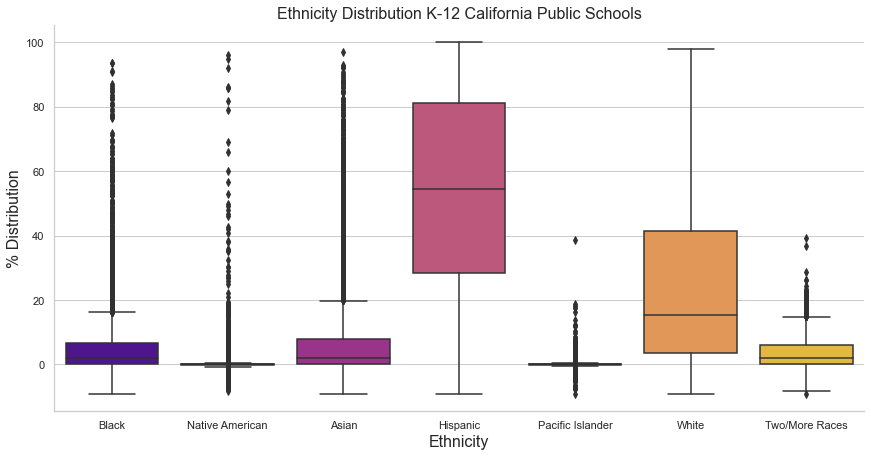

In [21]:
# Subset columns of interest
boxplot = language[['Black', 'Native American', 'Asian', 'Hispanic', 'Pacific Islander', 'White', 'Two/More Races']]

# Plot ethnicity distribution
plt.figure(figsize=(12,8))
sns.set_theme(style="whitegrid")
sns.catplot(data=boxplot, kind="box", height=6, aspect=2, palette="plasma")
_ = plt.title('Ethnicity Distribution K-12 California Public Schools', fontsize=16)
_ = plt.xlabel('Ethnicity', fontsize=16)
_ = plt.ylabel('% Distribution', fontsize=16)


<Figure size 864x576 with 0 Axes>

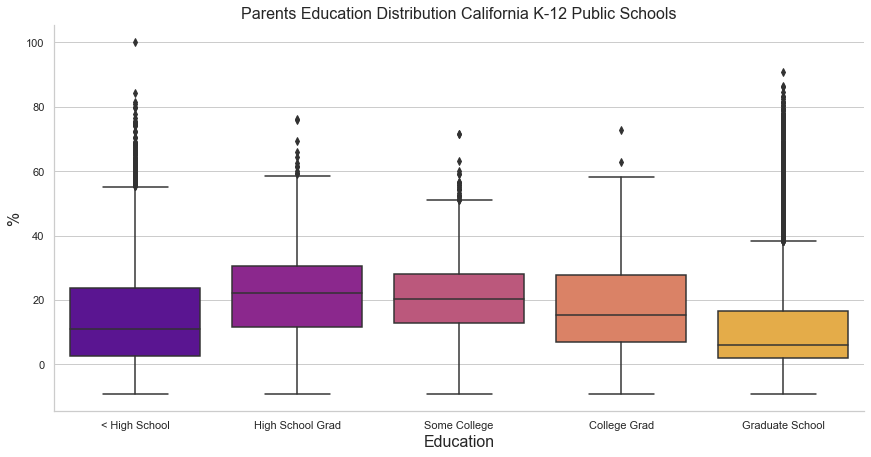

In [22]:
# Subset columns of interest
boxplot1 = language[['< High School', 'High School Grad','Some College', 'College Grad', 'Graduate School']]

# Plot distribution
plt.figure(figsize=(12,8))
sns.set_theme(style="whitegrid")
sns.catplot(data=boxplot1, kind="box", height=6, aspect=2, palette="plasma")
_ = plt.title('Parents Education Distribution California K-12 Public Schools', fontsize=16)
_ = plt.xlabel('Education', fontsize=16)
_ = plt.ylabel('%', fontsize=16)

------------

## In depth analysis of the following variables:

1. Median Income
2. Revenue per Pupil
3. Expenditure per Pupil
4. Expense per ADA

### 1. Median Income



- **High income zip codes investigation:**



    - There are 223 schools in zip codes where the median income per household is higher than $125,000.

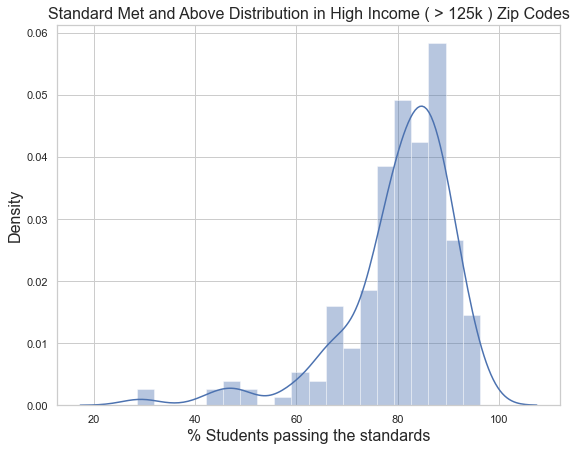

In [74]:
# Filtering income higher than 155k
high_income = language[language['Median Household Income'] > 125000]

# Distribution plot
plt.figure(figsize=(9,7))
sns.distplot(high_income['Percentage Standard Met and Above'])
plt.title('Standard Met and Above Distribution in High Income ( > 125k ) Zip Codes', fontsize = 16)

# Adding labels
_ = plt.xlabel('% Students passing the standards', fontsize=16)
_ = plt.ylabel('Density', fontsize=16)

plt.show()

<Figure size 864x576 with 0 Axes>

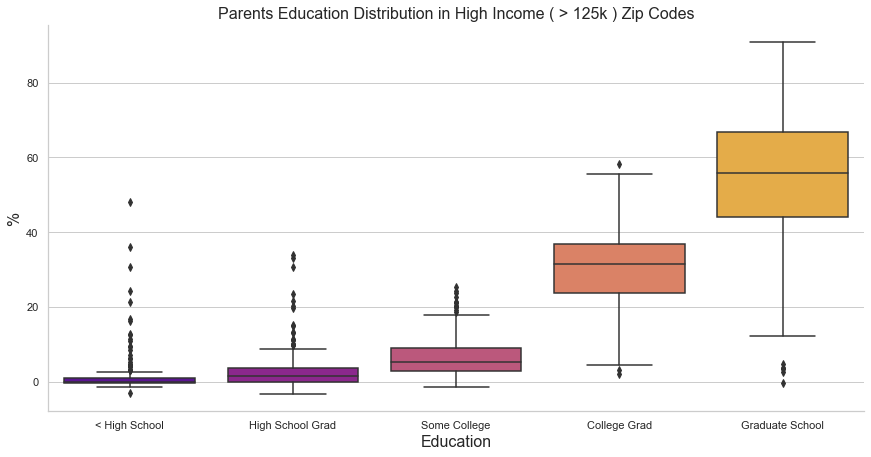

In [92]:
# Subset columns of interest
boxplot0 = high_income[['< High School', 'High School Grad','Some College', 'College Grad', 'Graduate School']]

# Plot distribution
plt.figure(figsize=(12,8))
sns.set_theme(style="whitegrid")
sns.catplot(data=boxplot0, kind="box", height=6, aspect=2, palette="plasma")
_ = plt.title('Parents Education Distribution in High Income ( > 125k ) Zip Codes', fontsize=16)
_ = plt.xlabel('Education', fontsize=16)
_ = plt.ylabel('%', fontsize=16)

<Figure size 864x576 with 0 Axes>

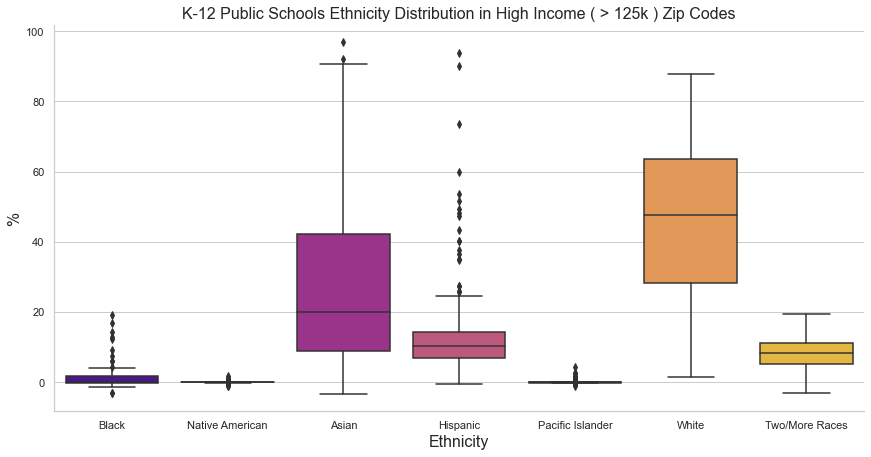

In [93]:
# Subset columns of interest
ethnicity_HI = high_income[['Black', 'Native American', 'Asian', 'Hispanic', 'Pacific Islander', 'White', 'Two/More Races']]

# Plot distribution
plt.figure(figsize=(12,8))
sns.set_theme(style="whitegrid")
sns.catplot(data=ethnicity_HI, kind="box", height=6, aspect=2, palette="plasma")
_ = plt.title('K-12 Public Schools Ethnicity Distribution in High Income ( > 125k ) Zip Codes', fontsize=16)
_ = plt.xlabel('Ethnicity', fontsize=16)
_ = plt.ylabel('%', fontsize=16)

- **Low Income Zip Codes Investigation:**


    - There are 370 schools in zip codes where the median income per household is lower than $30,000.

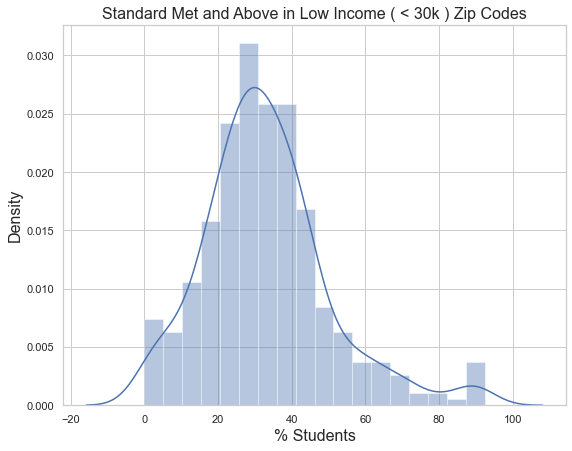

In [63]:
# Filtering income lower than 30k
low_income = language[language['Median Household Income'] < 30000]

# Distribution plot
plt.figure(figsize=(9,7))
sns.distplot(low_income['Percentage Standard Met and Above'])
plt.title('Standard Met and Above in Low Income ( < 30k ) Zip Codes', fontsize = 16)

# Adding labels
_ = plt.xlabel('% Students', fontsize=16)
_ = plt.ylabel('Density', fontsize=16)

plt.show()

<Figure size 864x576 with 0 Axes>

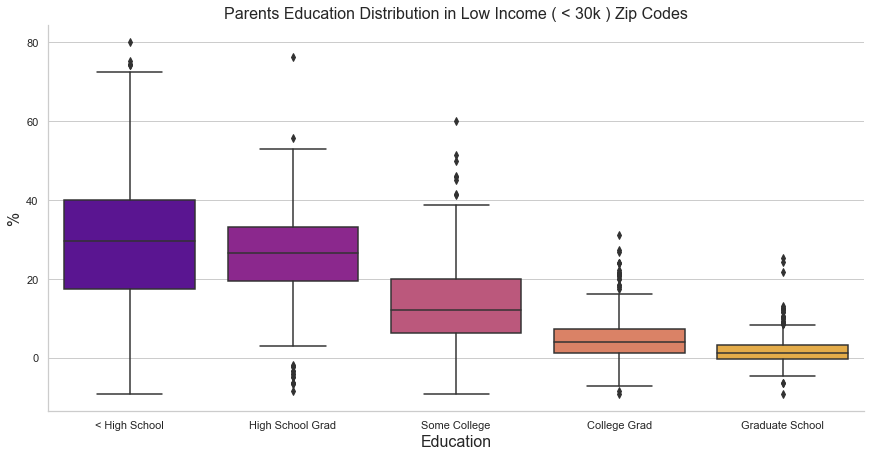

In [94]:
# Subset columns of interest
low0 = low_income[['< High School', 'High School Grad','Some College', 'College Grad', 'Graduate School']]

# Plot distribution
plt.figure(figsize=(12,8))
sns.set_theme(style="whitegrid")
sns.catplot(data=low0, kind="box", height=6, aspect=2, palette="plasma")
_ = plt.title('Parents Education Distribution in Low Income ( < 30k ) Zip Codes', fontsize=16)
_ = plt.xlabel('Education', fontsize=16)
_ = plt.ylabel('%', fontsize=16)

<Figure size 864x576 with 0 Axes>

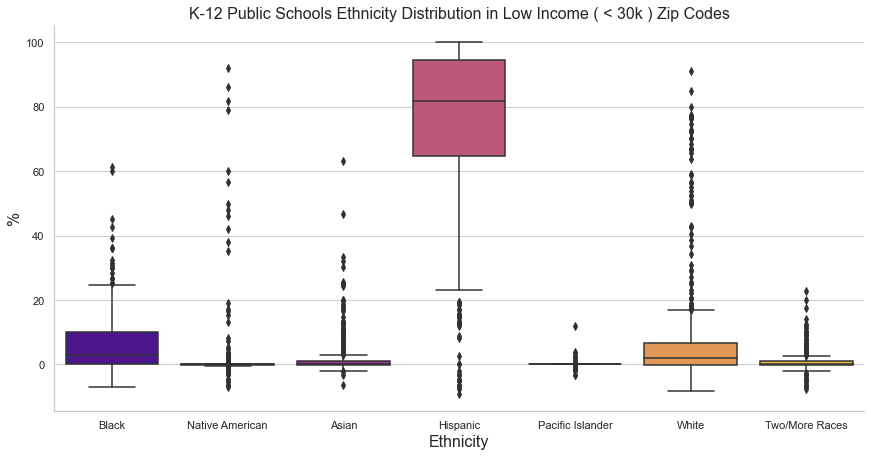

In [95]:
# Subset columns of interest
ethnicity_LO = low_income[['Black', 'Native American', 'Asian', 'Hispanic', 'Pacific Islander', 'White', 'Two/More Races']]

# Plot distribution
plt.figure(figsize=(12,8))
sns.set_theme(style="whitegrid")
sns.catplot(data=ethnicity_LO, kind="box", height=6, aspect=2, palette="plasma")
_ = plt.title('K-12 Public Schools Ethnicity Distribution in Low Income ( < 30k ) Zip Codes', fontsize=16)
_ = plt.xlabel('Ethnicity', fontsize=16)
_ = plt.ylabel('%', fontsize=16)

-----------

### 2. Revenue per Pupil


- **High Revenue Per Pupil Investigation:**


    - There are 334 schools with revenue per pupil higher than 20,000.



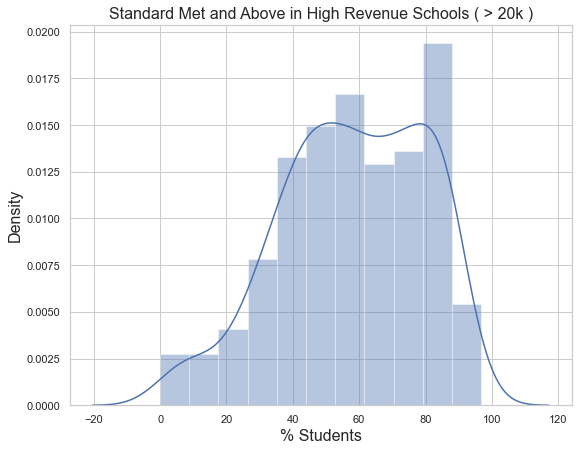

In [96]:
# Filtering total revenue per pupil higher than 20k
high_revenue = language[language['Total Revenue per Pupil'] > 20000]

# Distribution plot
plt.figure(figsize=(9,7))
sns.distplot(high_revenue['Percentage Standard Met and Above'])
plt.title('Standard Met and Above in High Revenue Schools ( > 20k )', fontsize = 16)

# Adding labels
_ = plt.xlabel('% Students', fontsize=16)
_ = plt.ylabel('Density', fontsize=16)

plt.show()

<Figure size 864x576 with 0 Axes>

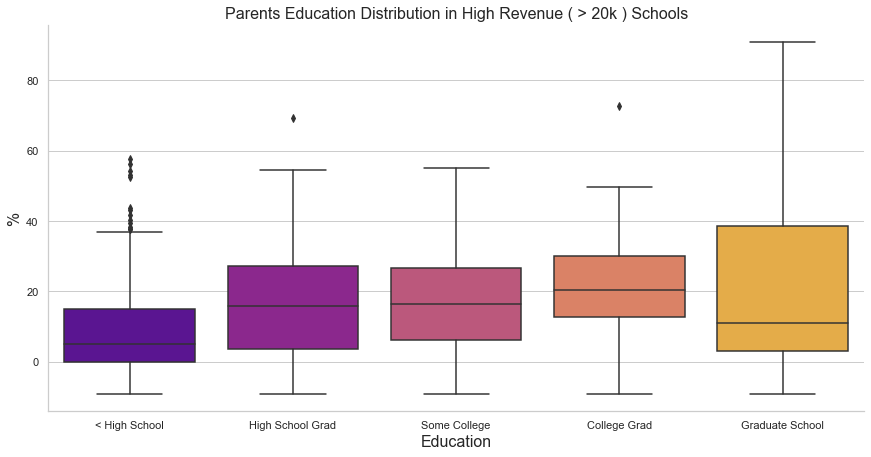

In [97]:
# Subset columns of interest
high0 = high_revenue[['< High School', 'High School Grad','Some College', 'College Grad', 'Graduate School']]

# Plot distribution
plt.figure(figsize=(12,8))
sns.set_theme(style="whitegrid")
sns.catplot(data=high0, kind="box", height=6, aspect=2, palette="plasma")
_ = plt.title('Parents Education Distribution in High Revenue ( > 20k ) Schools', fontsize=16)
_ = plt.xlabel('Education', fontsize=16)
_ = plt.ylabel('%', fontsize=16)

<Figure size 864x576 with 0 Axes>

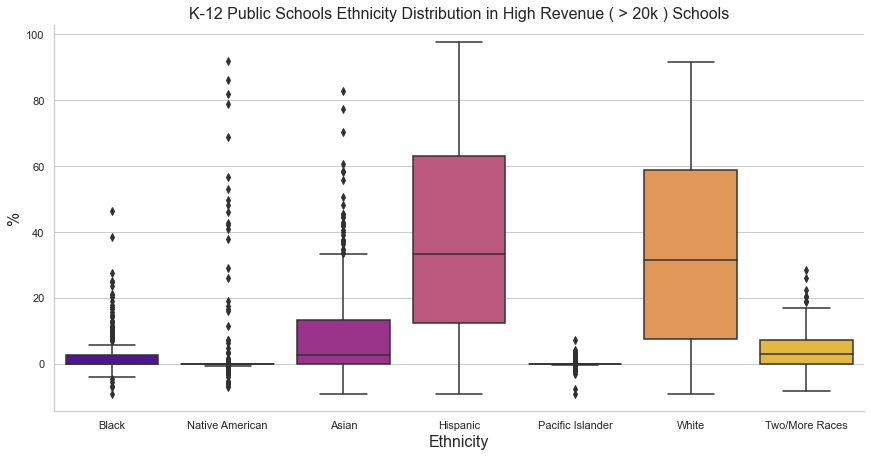

In [98]:
# Subset columns of interest
rev_high = high_revenue[['Black', 'Native American', 'Asian', 'Hispanic', 'Pacific Islander', 'White', 'Two/More Races']]

# Plot distribution
plt.figure(figsize=(12,8))
sns.set_theme(style="whitegrid")
sns.catplot(data=rev_high, kind="box", height=6, aspect=2, palette="plasma")
_ = plt.title('K-12 Public Schools Ethnicity Distribution in High Revenue ( > 20k ) Schools', fontsize=16)
_ = plt.xlabel('Ethnicity', fontsize=16)
_ = plt.ylabel('%', fontsize=16)

--------

### 3. Expenditure per Pupil


- **High Expenditure Per Pupil Investigation:**


    - There are 373 schools with expenditure per pupil higher than 20,000.



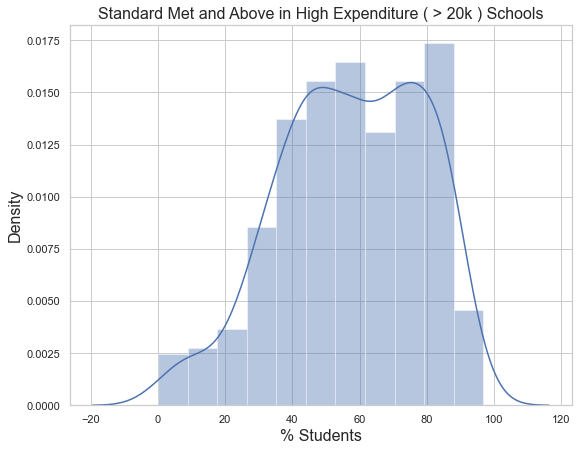

In [101]:
# Filtering total expenditure per pupil higher than 20k
high_expenditure = language[language['Total Expenditures per Pupil'] > 20000]

# Distribution plot
plt.figure(figsize=(9,7))
sns.distplot(high_expenditure['Percentage Standard Met and Above'])
plt.title('Standard Met and Above in High Expenditure ( > 20k ) Schools', fontsize = 16)

# Adding labels
_ = plt.xlabel('% Students', fontsize=16)
_ = plt.ylabel('Density', fontsize=16)

plt.show()

----------

### 4. Expense per ADA



- **High Expense Per ADA Investigation:**



    - There are 183 schools with expense per ada higher than $20,000.


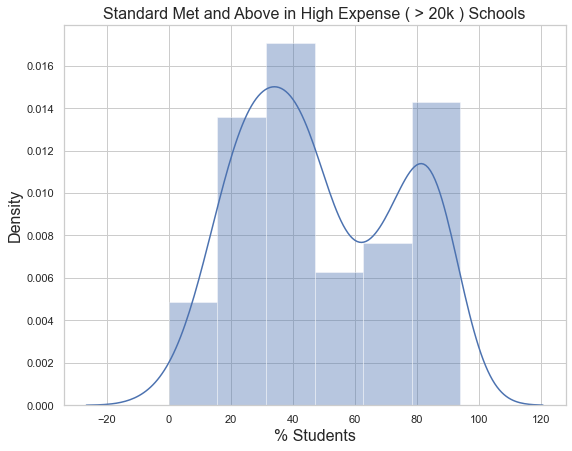

In [105]:
# Filtering current expense per ada higher than 20k
high_expense = language[language['Current Expense Per ADA'] > 20000]

# Distribution plot
plt.figure(figsize=(9,7))
sns.distplot(high_expense['Percentage Standard Met and Above'])
plt.title('Standard Met and Above in High Expense ( > 20k ) Schools', fontsize = 16)

# Adding labels
_ = plt.xlabel('% Students', fontsize=16)
_ = plt.ylabel('Density', fontsize=16)

plt.show()

------------

### Replacing extreme values with 95th percentile for the following variables
- Revenue per pupil
- Expenditure per pupil
- Expense per ADA

In [37]:
# finding 90th for each variable
revenue_per = language['Total Revenue per Pupil'].quantile(0.95)
expenditure_per = language['Total Expenditures per Pupil'].quantile(0.95)
ada_expense_per = language['Current Expense Per ADA'].quantile(0.95).round(2)

# print values
print('Total Revenue per Pupil 97th percentile: ', revenue_per)
print('Total Expenditure per Pupil 97th percentile: ', expenditure_per)
print('Total ADA Expense per Pupil 95th percentile: ', ada_expense_per)

Total Revenue per Pupil 97th percentile:  18252.0
Total Expenditure per Pupil 97th percentile:  18385.0
Total ADA Expense per Pupil 95th percentile:  16405.57


In [38]:
# Replace values above x with 95th percentile


--------

## Visualizing relationship between variables
- Correlation matrix
    - Look at correlation for each variable in the dataframe
    - Use Pearson correlation heatmap
- Pairplots
    - Visualize variables distribution against one another

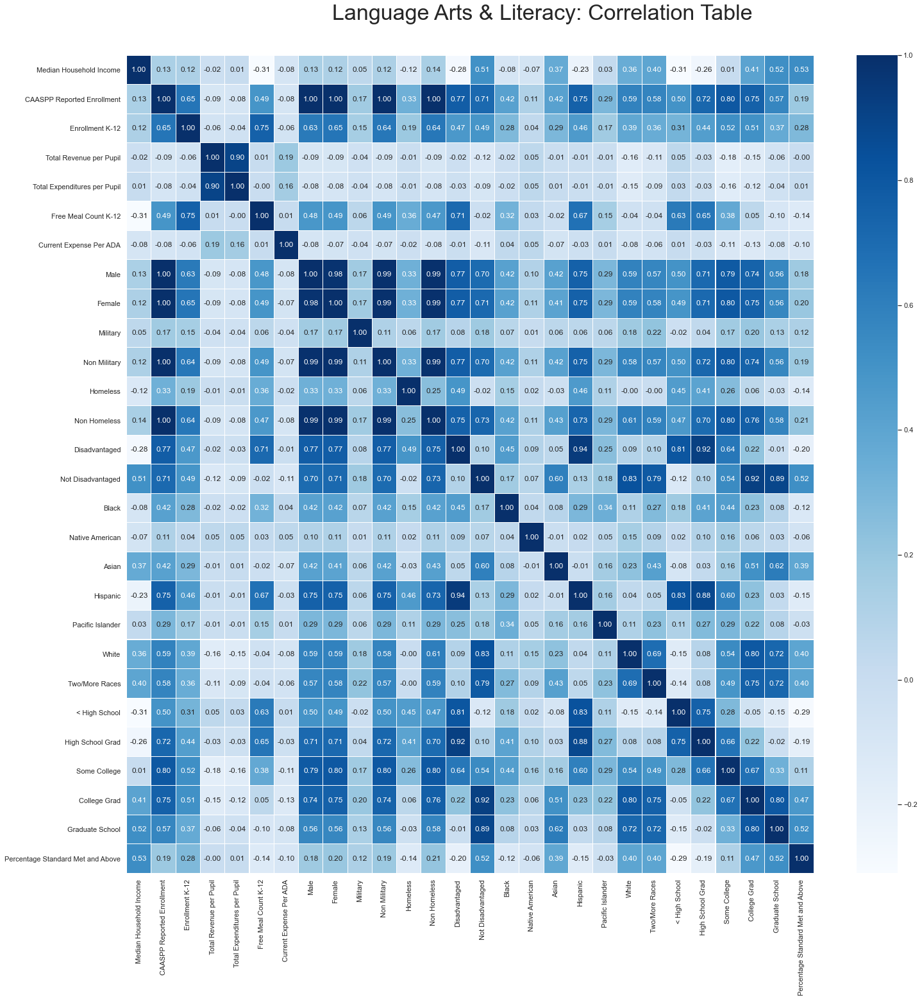

In [108]:
# Run correlation on table constructed with count instead of percentage values
corrmat = table.corr()
f, ax = plt.subplots(figsize=(24, 22))
hm = sns.heatmap(round(corrmat,2), annot=True, ax=ax, cmap="Blues",fmt='.2f',
                 linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('Language Arts & Literacy: Correlation Table', fontsize=34)

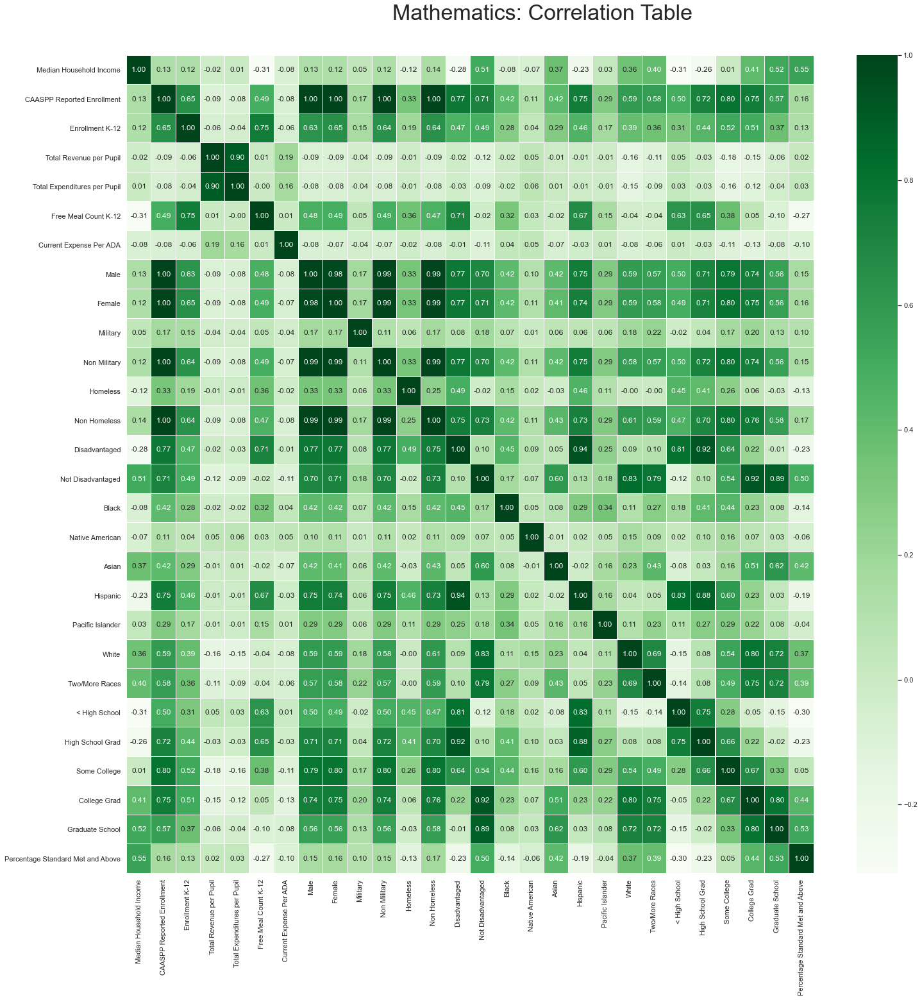

In [109]:
# Run correlation on table constructed with count instead of percentage values
corrmat = table1.corr()
f, ax = plt.subplots(figsize=(24, 22))
hm = sns.heatmap(round(corrmat,2), annot=True, ax=ax, cmap="Greens",fmt='.2f',
                 linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('Mathematics: Correlation Table', fontsize=34)

## Pairplots

One way of evaluating the variables distribution against each other.

1. Language Arts & Literature

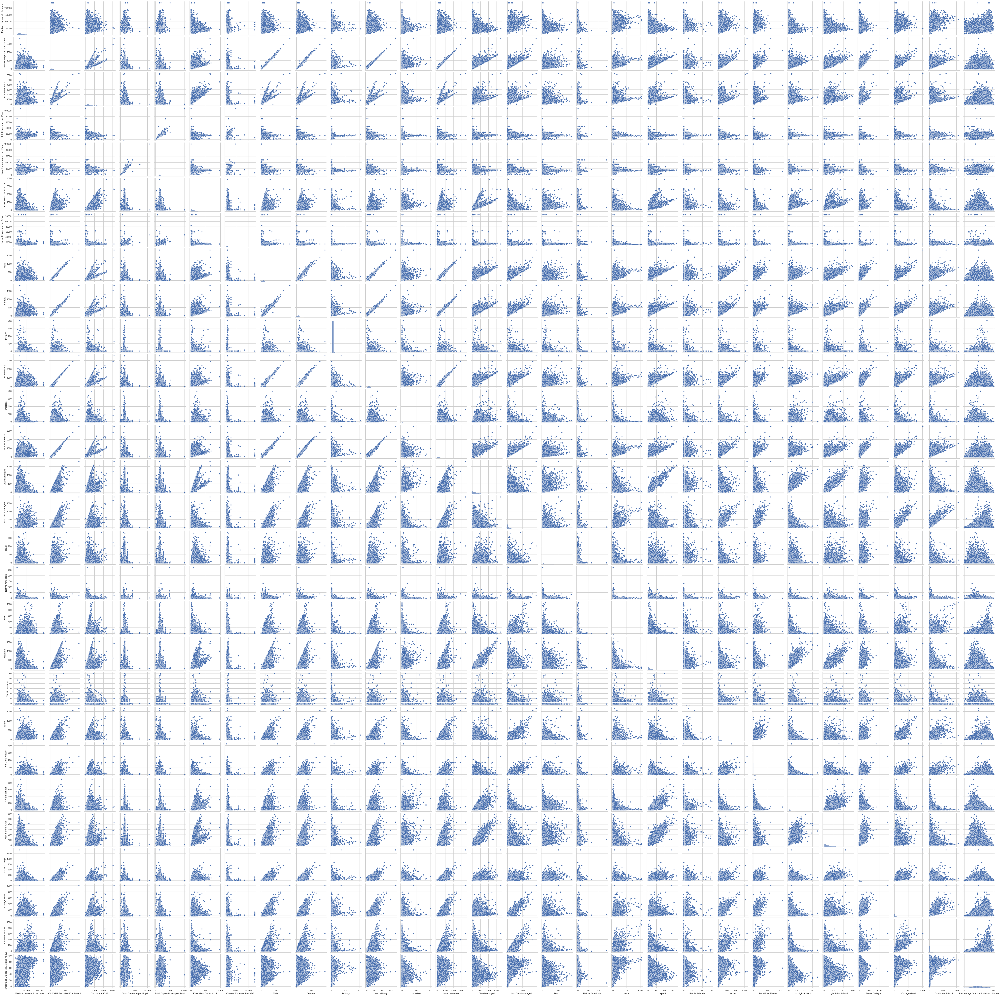

In [110]:
# # Create a pairplot for all numeric variables 
# sns.pairplot(table,  palette='Set1')
# plt.show()

-----------

## Pairwise relationship between dependent variable and independent variables



- **Dependent variable**: 
    - 'Percentage Standard Met and Above'
- **Independent variables**:
    - 'Median Household Income', 
    - 'CAASPP Reported Enrollment', 'Enrollment K-12', 
    - 'Total Revenue per Pupil', 'Total Expenditures per Pupil', 
    - 'Free Meal Count K-12', 'Current Expense Per ADA', 
    - 'Male', 'Female', 
    - 'Military', 'Non Military',
    - 'Homeless', 'Non Homeless', '
    - Disadvantaged', 'Not Disadvantaged',
    - 'Black', 'Native American', 'Asian', 'Hispanic', 'Pacific Islander','White', 'Two/More Races', 
    - '< High School', 'High School Grad','Some College', 'College Grad', 'Graduate School'

## Bar Plots of Pairwise Relationship between Dependent and Independent Variables

In [39]:
def bar_plot(df, var):
    bins = pd.cut(df[var], [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100], include_lowest=True)

    # Groupby Y and agg the functions to pass on Y using X
    grouped_df = df.groupby(bins)['Percentage Standard Met and Above'].agg(['count', 'mean'])

    # set labels
    labels = ['0-10', '11-20', '21-30', '31-40', '41-50', '51-60', '61-70', '71-80', '81-90', '91-100']
    
    # Plot
    ax = grouped_df.plot.bar(y='mean', figsize=(12,8), legend=False)
    ax.set_xticklabels(labels, rotation=45)

    # Annotate bars
    for count, p in zip(grouped_df['count'], ax.patches):
        ax.annotate(count, (p.get_x() * 1.01, p.get_height() * 1.01))

    # Label axis
    plt.title(var, fontsize = 18)
    _ = plt.xlabel('% Total Students', fontsize=16)
    _ = plt.ylabel('Average % Students Passed', fontsize=16)
    


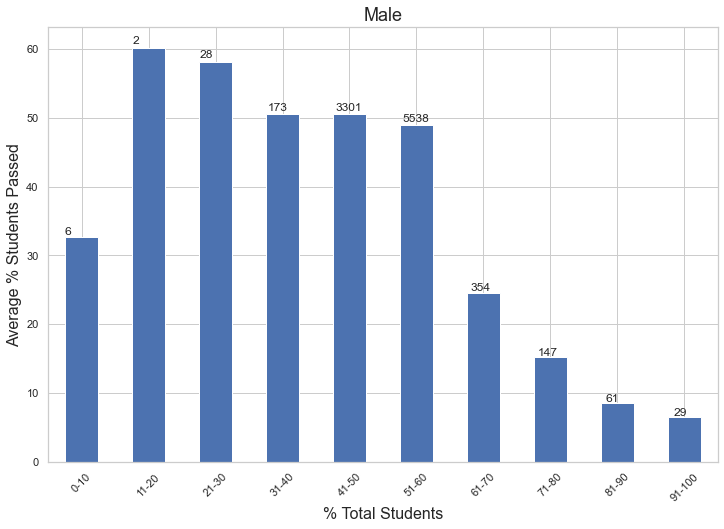

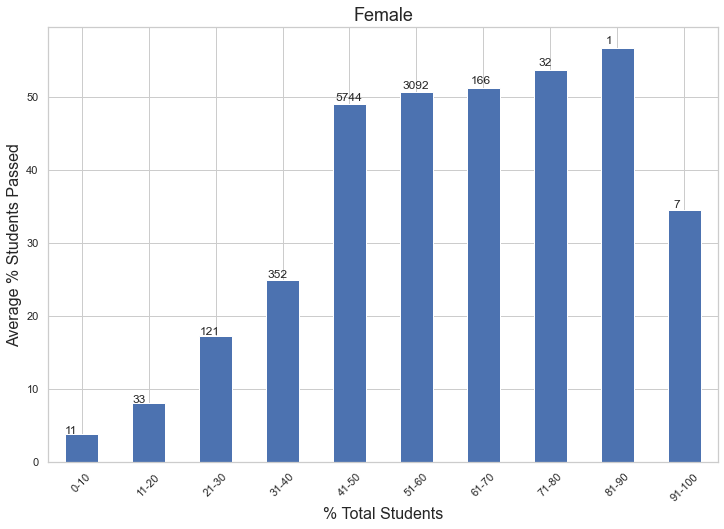

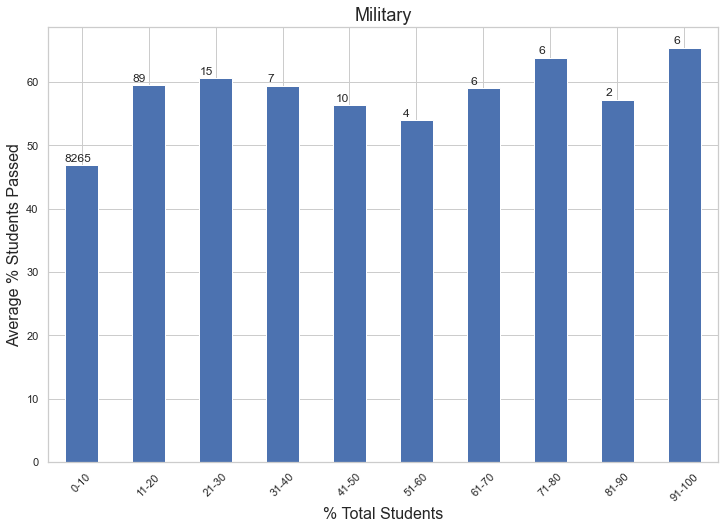

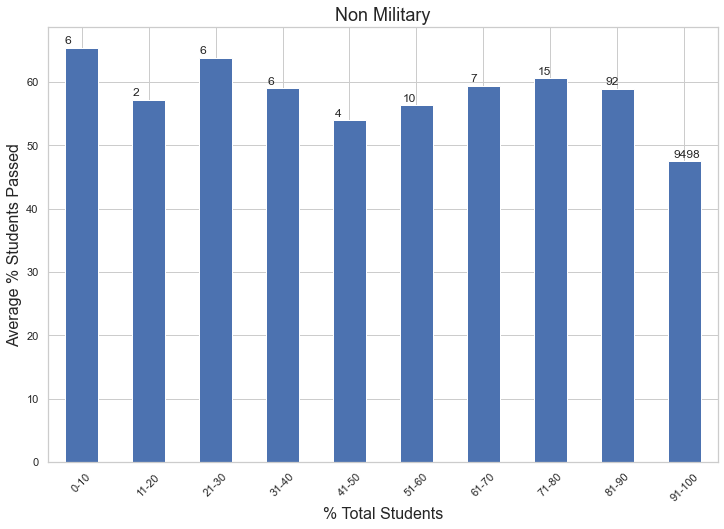

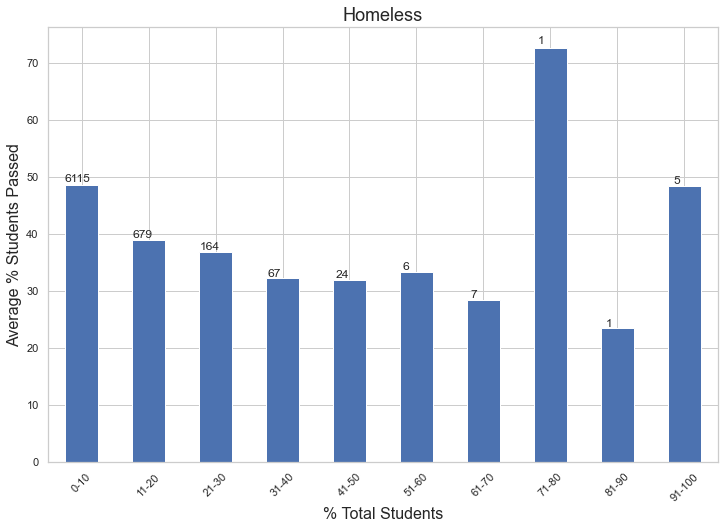

...

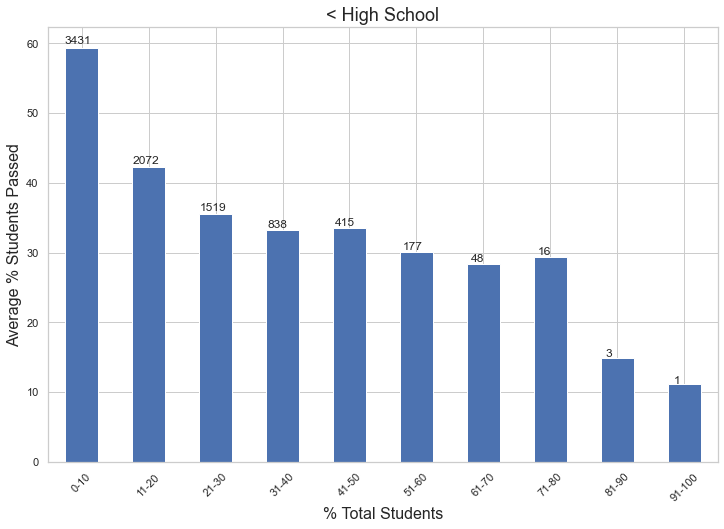

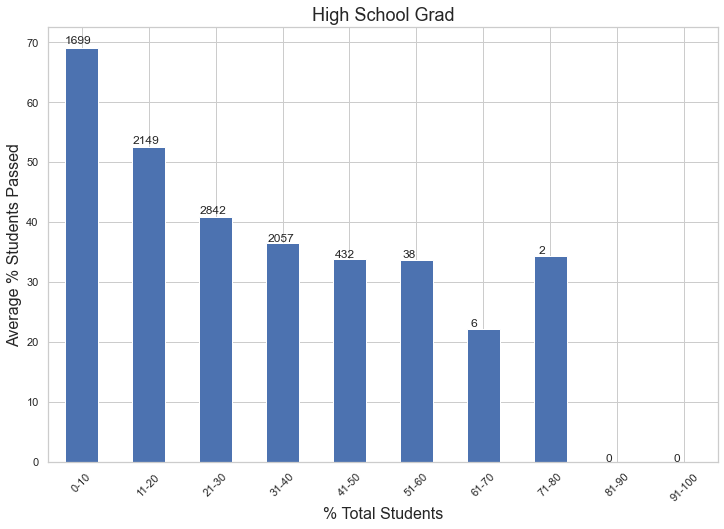

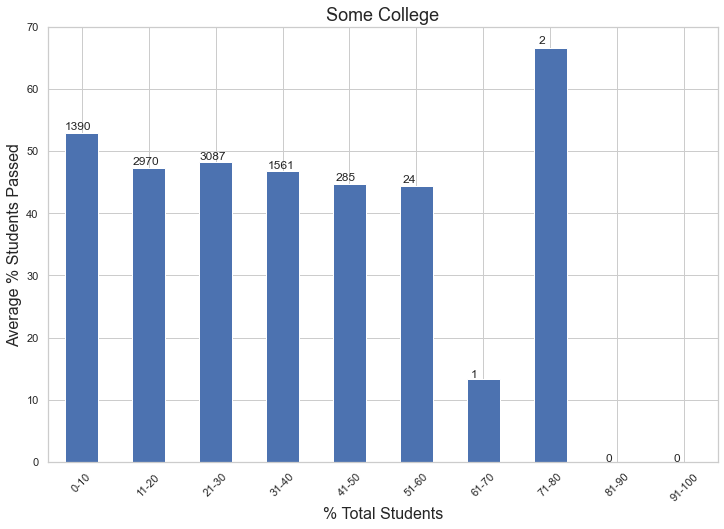

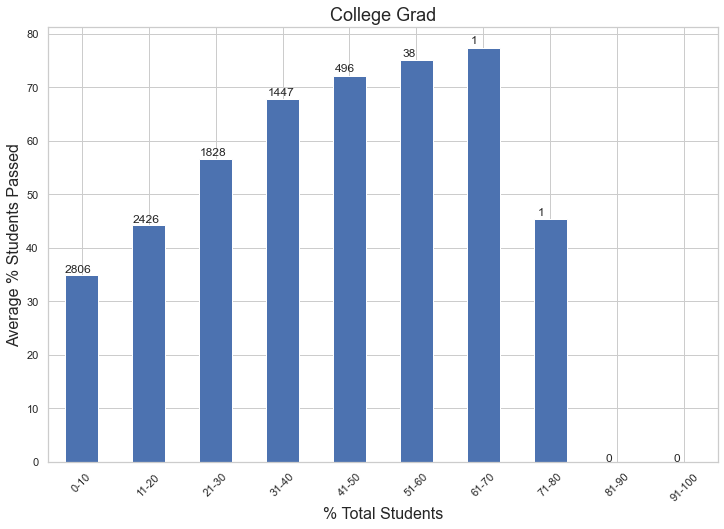

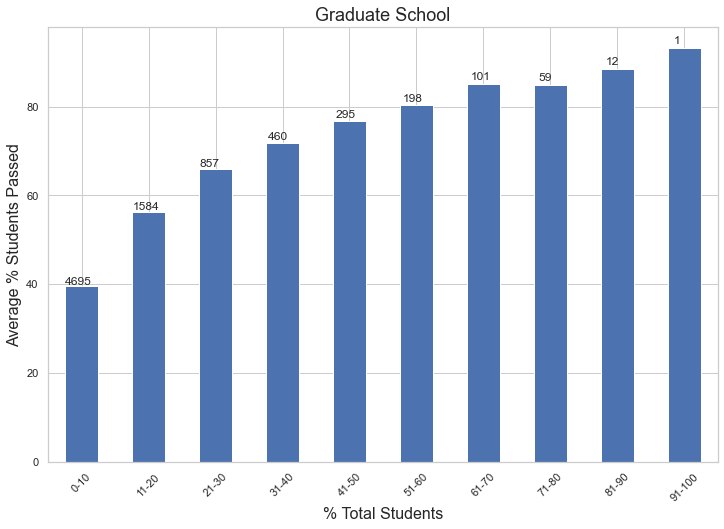

In [40]:
demographics = ['Male', 'Female', 'Military', 'Non Military', 'Homeless', 'Non Homeless',
       'Disadvantaged', 'Not Disadvantaged', 'Black', 'Native American', 'Asian', 'Hispanic',
       'Pacific Islander', 'White', 'Two/More Races', '< High School',
       'High School Grad', 'Some College', 'College Grad', 'Graduate School']

for var in demographics:
    bar_plot(language, var)

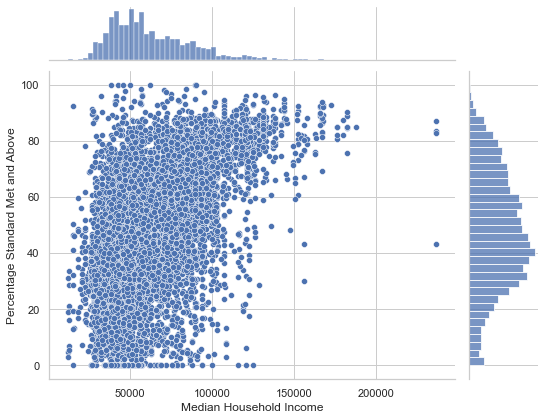

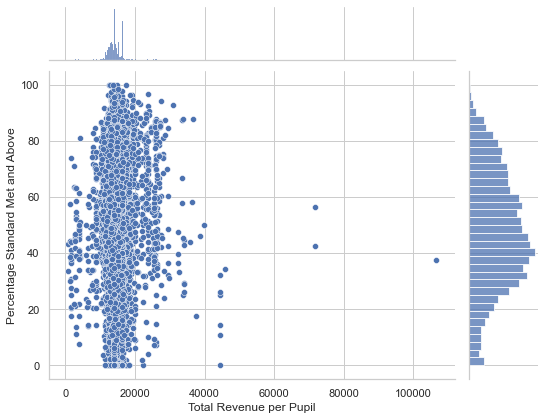

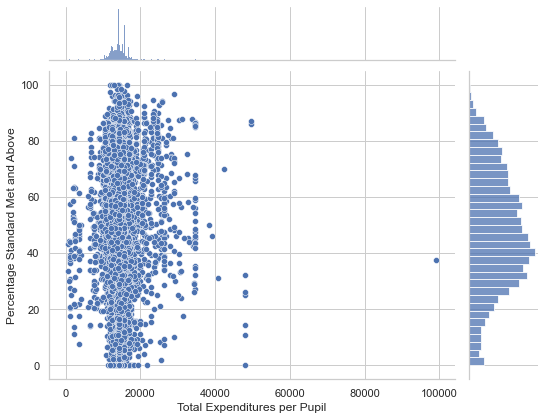

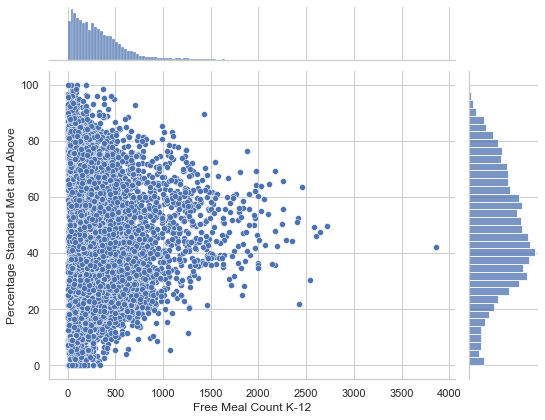

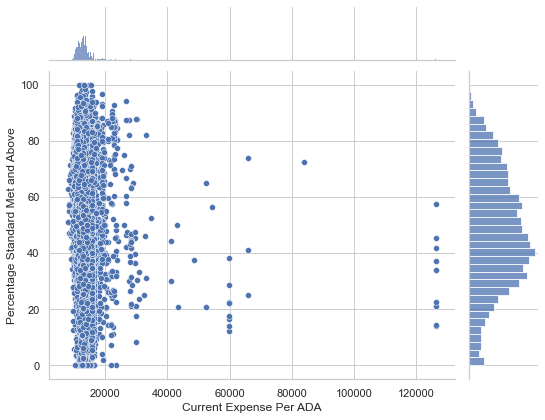

In [112]:
# jointplot
# An alternative graph to visualize the overlap of the distribution

def joint_plot(df, var):
    _ = sns.jointplot(x=var, y='Percentage Standard Met and Above', data=df)
    _.fig.set_size_inches(8,6)
    
demographics = ['Median Household Income', 'Total Revenue per Pupil', 'Total Expenditures per Pupil',
       'Free Meal Count K-12', 'Current Expense Per ADA']

for var in demographics:
    joint_plot(language, var)

------------

## Pairwise relationship between variables showing high correlation


<!-- 
- **Dependent variable**: 
    - 'Percentage Standard Met and Above'
- **Independent variables**:
    - 'Median Household Income', 
    - 'CAASPP Reported Enrollment', 'Enrollment K-12', 
    - 'Total Revenue per Pupil', 'Total Expenditures per Pupil', 
    - 'Free Meal Count K-12', 'Current Expense Per ADA', 
    - 'Male', 'Female', 
    - 'Military', 'Non Military',
    - 'Homeless', 'Non Homeless', '
    - Disadvantaged', 'Not Disadvantaged',
    - 'Black', 'Native American', 'Asian', 'Hispanic', 'Pacific Islander','White', 'Two/More Races', 
    - '< High School', 'High School Grad','Some College', 'College Grad', 'Graduate School' -->

-------------

### Questions:
- Are there variables that are particularly significant in terms of explaining the answer to your project question?
- Are there significant differences between subgroups in your data that may be relevant to your project aim?
- Are there strong correlations between pairs of independent variables or between an independent and a dependent variable?
- What are the most appropriate tests to use to analyze these relationships?

---------

### Using heatmaps to understand the students demographics distribution with location

- Percentage of students who pass the standards
- Disadvantaged and not disadvantage students
- < HS
- College graduate
- Graduate school
- Household income

In [106]:
# map
folium_map = folium.Map(location=[36.778259, -119.417931],
                        zoom_start=7,
                        tiles="OpenStreetMap")
folium_map
# This sets up a basic map of CA
# Tiles options: "OpenStreetMap", "Mapbox Bright","Stamen Toner","Mapbox Control Room","Stamen Terrain"

In [111]:
max_amount = float(language['Percentage Standard Met and Above'].max())

folium_hmap = folium.Map(location=[36.778259, -119.417931],
                        zoom_start=7,
                        tiles="OpenStreetMap")

hm_wide = HeatMap( list(zip(language['Latitude'], language['Longitude'], language['Percentage Standard Met and Above'])),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=20, blur=6, 
                   max_zoom=15, 
                 )

folium_hmap.add_child(hm_wide)